# Computer Vision 2024 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly. 

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at 

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>. 

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [6]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [7]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)
    
    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography() 
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector (covered in week 3) and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test" to find good matches. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [8]:
# load images as grey scale
img1 = cv2.imread('book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")

img2 = cv2.imread("book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")


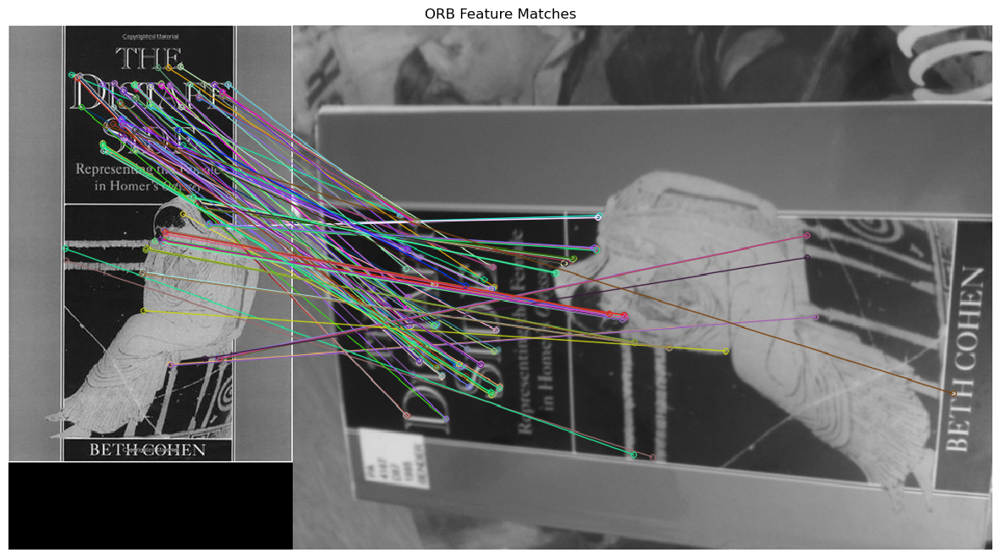

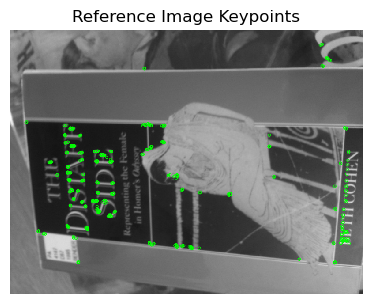

In [9]:
# Your code for descriptor matching tests here
# Create ORB feature extractor
orb = cv2.ORB_create()
# Detect keypoints
kp1 = orb.detect(img1, None)
kp2 = orb.detect(img2, None)
# compute detector and descriptor, see (2) above
kp1, des1 = orb.compute(img1, kp1)
kp2, des2 = orb.compute(img2, kp2)
# find the keypoints and descriptors with ORB, see (2) above


# draw keypoints, see (2) above
img1_with_keypoints = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0), flags=0)
img2_with_keypoints = cv2.drawKeypoints(img2, kp2, None, color=(0, 255, 0), flags=0)

# create BFMatcher object, see (3) above
# Match descriptors, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test, see (3) above
#good = []
#for m,n in matches:
good_matches = []
ratio = 0.8
for m, n in matches:
    if m.distance < ratio * n.distance:
        good_matches.append([m])

# draw matches, see (4) above
img_matches = cv2.drawMatchesKnn(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(15, 10))
plt.imshow(img_matches)
plt.title('ORB Feature Matches')
plt.axis('off')
plt.show()
plt.subplot(1, 2, 2)
plt.imshow(img2_with_keypoints, cmap='gray')
plt.title('Reference Image Keypoints')
plt.axis('off')
plt.show()


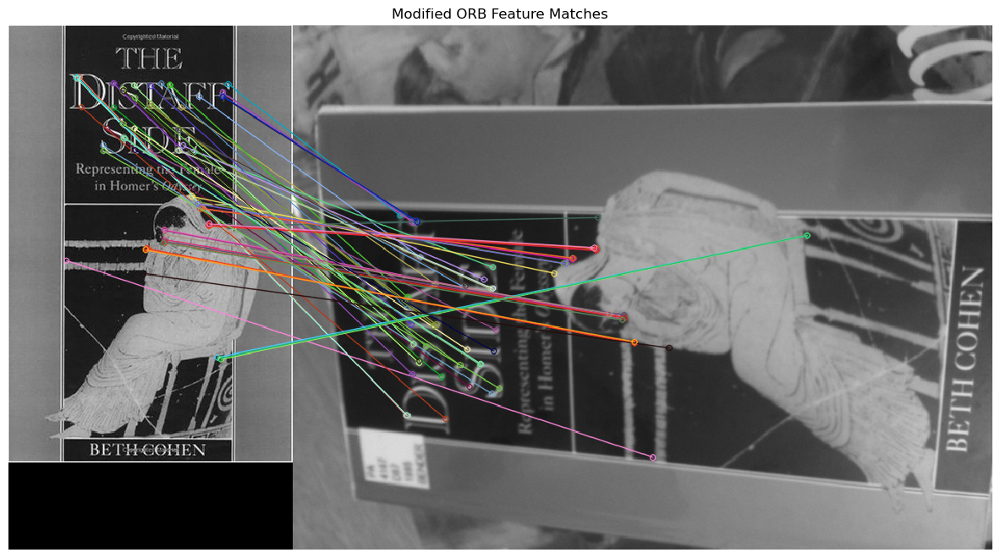

In [10]:
orb_modified = cv2.ORB_create(nfeatures=500)
kp1_mod, des1_mod = orb_modified.detectAndCompute(img1, None)
kp2_mod, des2_mod = orb_modified.detectAndCompute(img2, None)
bf_modified = cv2.BFMatcher(cv2.NORM_HAMMING2)
matches_mod = bf_modified.knnMatch(des1_mod, des2_mod, k=2)

good_matches_mod = []
ratio_mod = 0.7
for m, n in matches_mod:
    if m.distance < ratio_mod * n.distance:
        good_matches_mod.append([m])

img_matches_mod = cv2.drawMatchesKnn(img1, kp1_mod, img2, kp2_mod, good_matches_mod, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(15, 10))
plt.imshow(img_matches_mod)
plt.title('Modified ORB Feature Matches')
plt.axis('off')
plt.show()

***Your explanation of what you have done, and your results, here***

Increasing the value of nfeatures (for example, increasing it from the default value to 500) will detect more keypoints, which may increase the number of matches but will also increase computational complexity and time. Reducing the nfeatures value will decrease the number of keypoints, potentially reducing the number of matches, but the computation speed will be faster.

3. Estimate a homography transformation based on the matches, using `. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

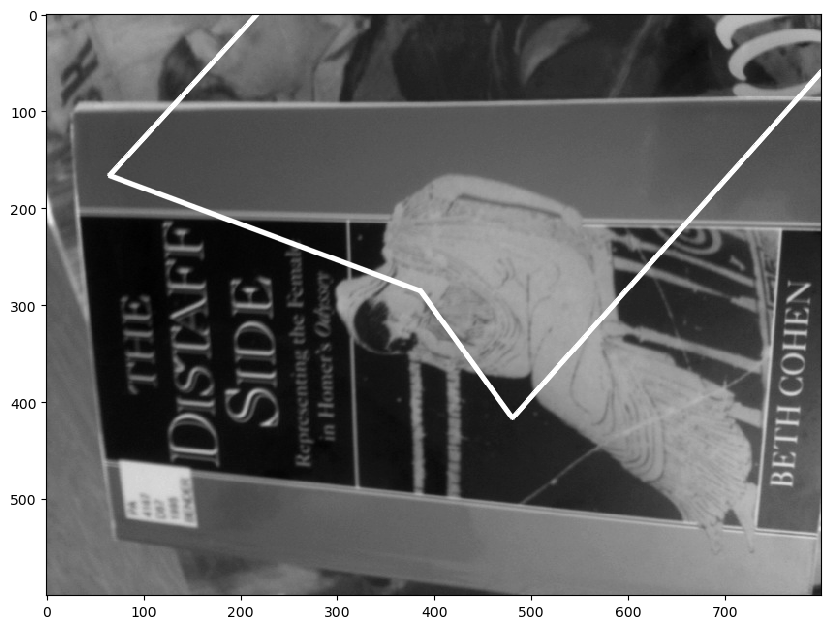

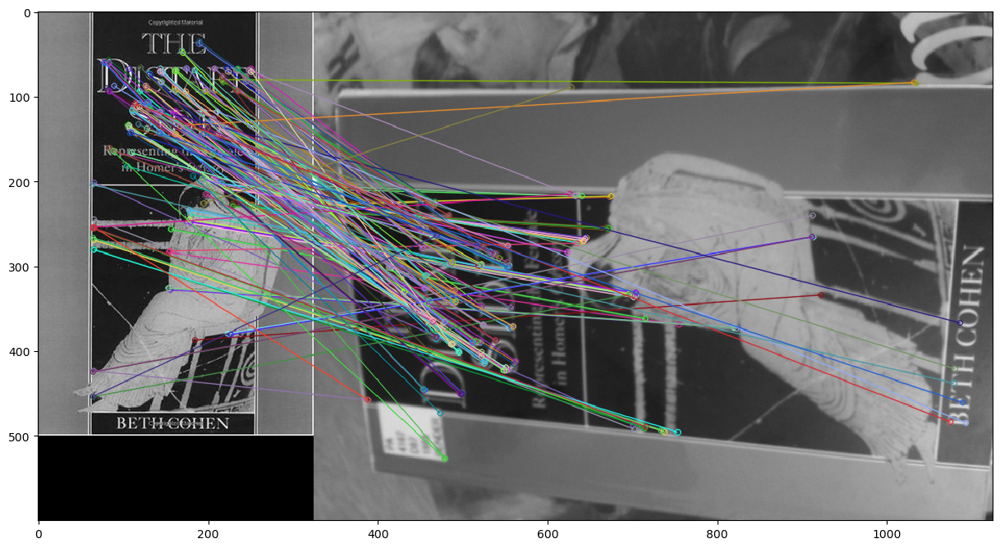

Number of inliers: 214 out of 214


In [11]:
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
def estimate_homography_and_display(ref_image_path, query_image_path):
    # Load images
    ref_image = cv2.imread(ref_image_path, 0)  # reference book cover image
    query_image = cv2.imread(query_image_path, 0)  # query image

    if ref_image is None or query_image is None:
        print("Error loading images.")
        return

    # Detect ORB keypoints and descriptors
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(ref_image, None)
    kp2, des2 = orb.detectAndCompute(query_image, None)

    # Match descriptors using BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Extract location of good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Find homography using the least squares method
    M, mask = cv2.findHomography(src_pts, dst_pts, 0)
    matchesMask = mask.ravel().tolist()

    # Draw outline of the reference image on the query image
    draw_outline(ref_image, query_image, M)

    # Draw matches with inliers highlighted
    img_matches = cv2.drawMatches(ref_image, kp1, query_image, kp2, matches, None, 
                                  matchesMask=matchesMask, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Display result
    plt.figure(figsize=(15, 15))
    plt.imshow(img_matches)
    plt.show()

    # Print number of inliers
    inliers = np.sum(mask)
    print(f"Number of inliers: {inliers} out of {len(matches)}")

# Example usage
estimate_homography_and_display('book_covers/Reference/001.jpg', 'book_covers/Query/001.jpg')




***Your explanation of results here***

By using the RANSAC method to compute homography transformations, the transformed outline of the reference image should closely align with the corresponding region in the query image, indicating a successful transformation. Densely clustered lines connecting matched keypoints (inliers) around the region of interest show a good match. These functions process multiple reference and query images, homography transformations, and visualize the results for each pair effectively.

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

Using RANSAC threshold 3.0


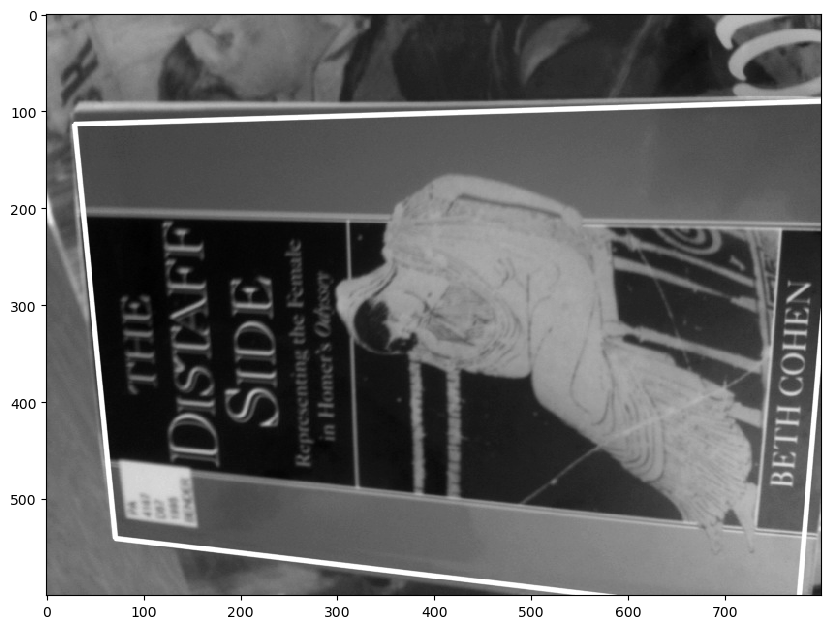

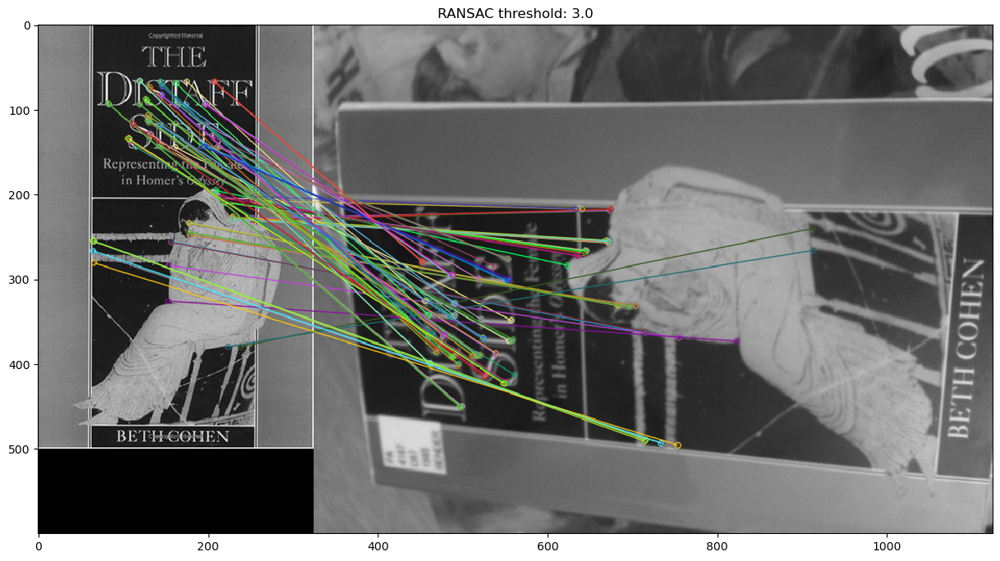

RANSAC threshold: 3.0 - Number of inliers: 98 out of 214

Using RANSAC threshold 5.0


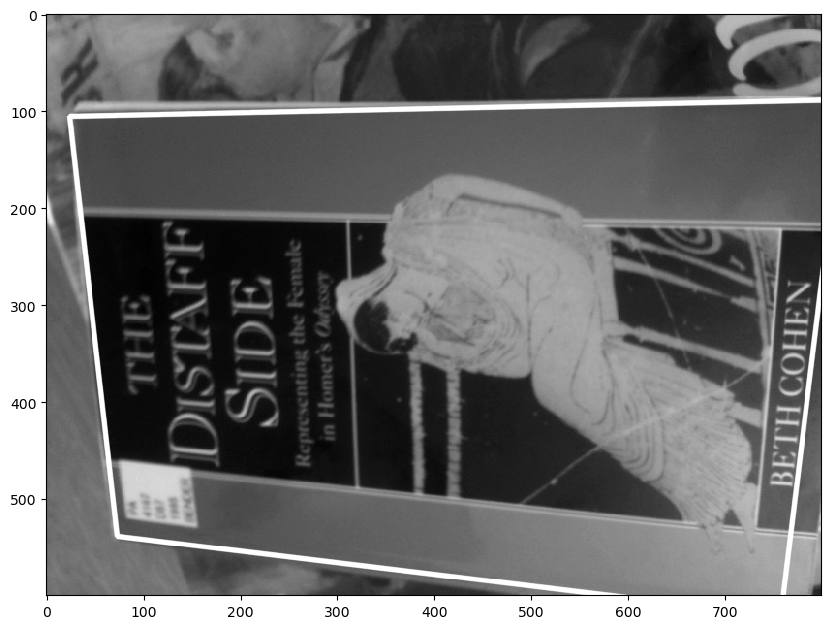

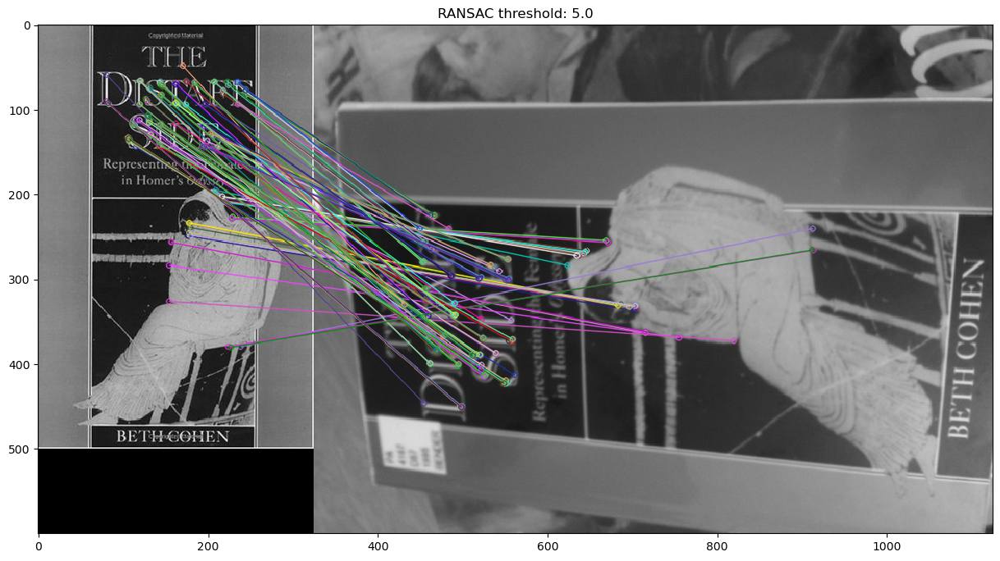

RANSAC threshold: 5.0 - Number of inliers: 130 out of 214

Using RANSAC threshold 10.0


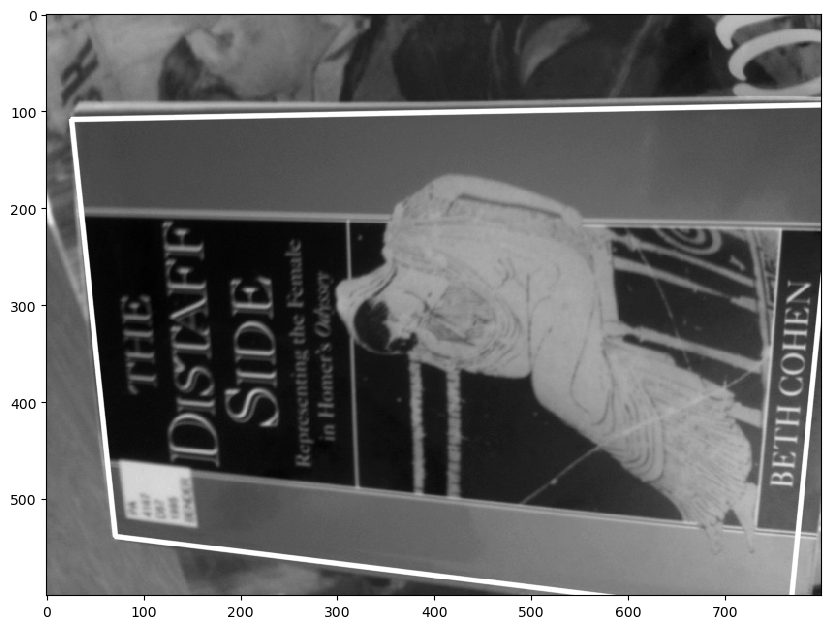

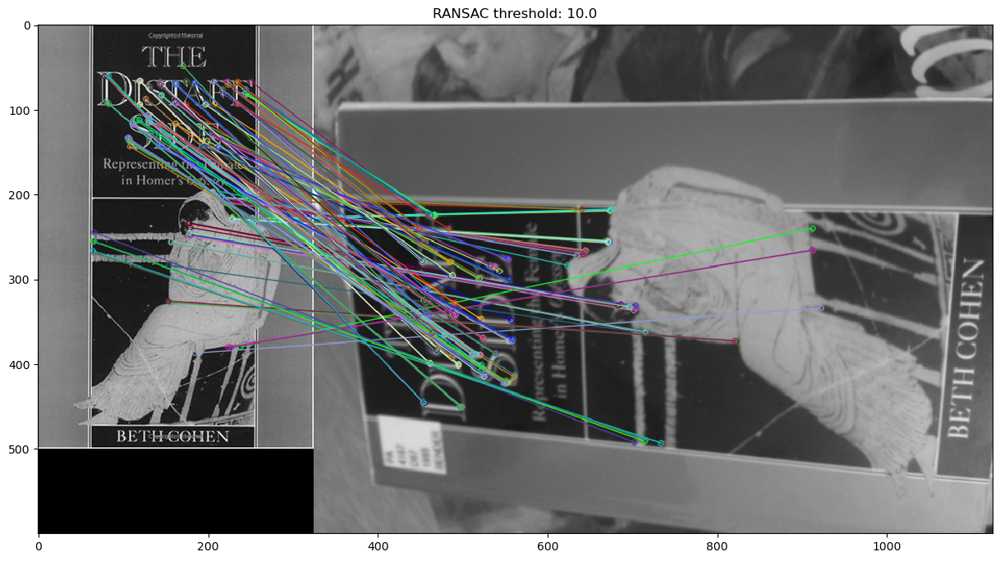

RANSAC threshold: 10.0 - Number of inliers: 152 out of 214


In [12]:
def estimate_homography_and_display(ref_image_path, query_image_path, ransac_reproj_threshold=5.0):
    # Load images
    ref_image = cv2.imread(ref_image_path, 0)  # reference book cover image
    query_image = cv2.imread(query_image_path, 0)  # query image

    if ref_image is None or query_image is None:
        print("Error loading images.")
        return

    # Detect ORB keypoints and descriptors
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(ref_image, None)
    kp2, des2 = orb.detectAndCompute(query_image, None)

    # Match descriptors using BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Extract location of good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    
    # using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
    matchesMask = mask.ravel().tolist()

    # draw frame
    draw_outline(ref_image, query_image, M)
    # draw inliers
    img_matches = cv2.drawMatches(ref_image, kp1, query_image, kp2, matches, None, 
                                  matchesMask=matchesMask, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Display result
    plt.figure(figsize=(15, 15))
    plt.imshow(img_matches)
    plt.title(f"RANSAC threshold: {ransac_reproj_threshold}")
    plt.show()

     
    # inlier number
    inliers = np.sum(mask)
    print(f"RANSAC threshold: {ransac_reproj_threshold} - Number of inliers: {inliers} out of {len(matches)}")

ref_image_path = 'book_covers/Reference/001.jpg'
query_image_path = 'book_covers/Query/001.jpg'

print("Using RANSAC threshold 3.0")
estimate_homography_and_display(ref_image_path, query_image_path, 3.0)

print("\nUsing RANSAC threshold 5.0")
estimate_homography_and_display(ref_image_path, query_image_path, 5.0)

print("\nUsing RANSAC threshold 10.0")
estimate_homography_and_display(ref_image_path, query_image_path, 10.0)



***Your explanation of what you have tried, and results here***
By using the RANSAC method to compute the homography with different reprojection thresholds (3.0, 5.0, and 10.0), we observed that lower thresholds resulted in fewer but more accurate inliers, while higher thresholds increased the number of inliers but potentially included more outliers, affecting the accuracy of the alignment between the reference and query images.

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

Processing pair: book_covers/Reference/002.jpg and book_covers/Query/002.jpg


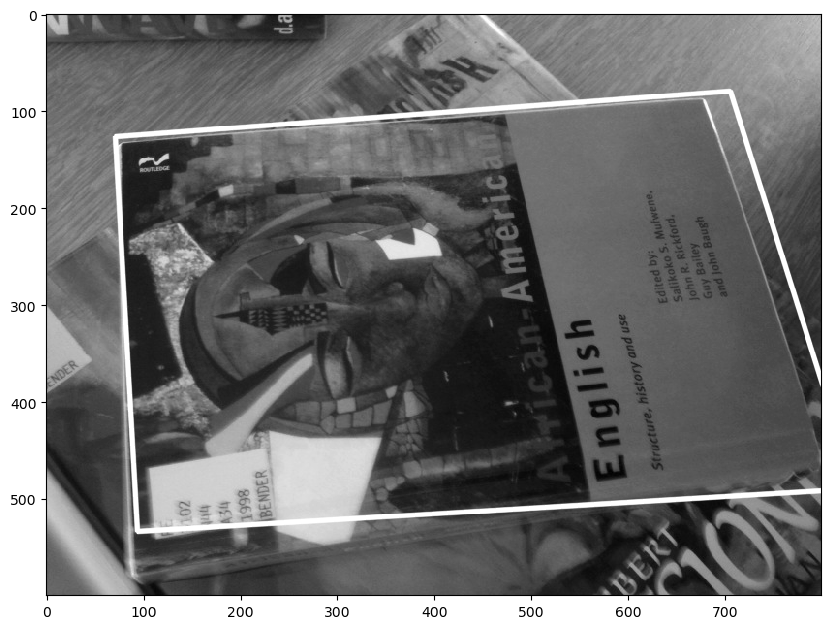

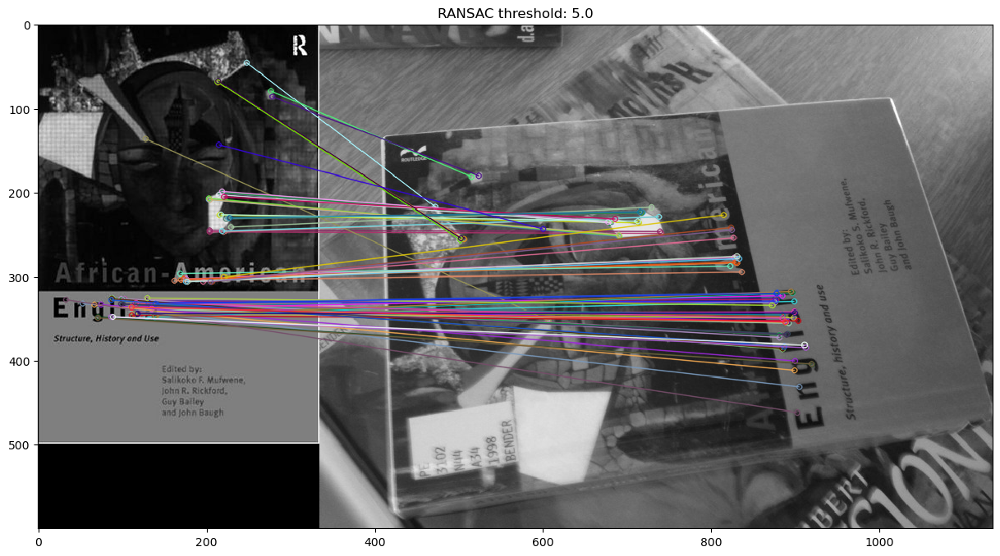

RANSAC threshold: 5.0 - Number of inliers: 87 out of 161
Failed to process pair: book_covers/Reference/002.jpg and book_covers/Query/002.jpg
Processing pair: book_covers/Reference/003.jpg and book_covers/Query/003.jpg


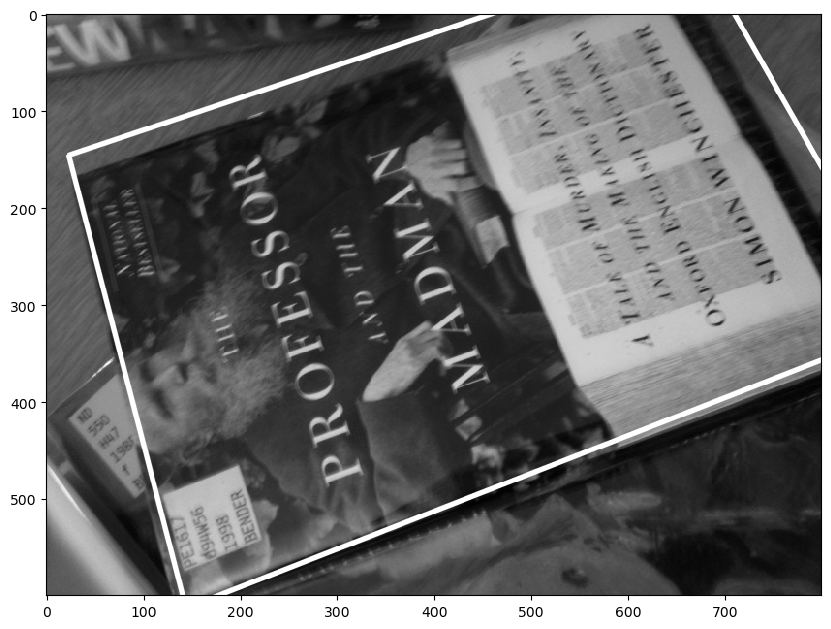

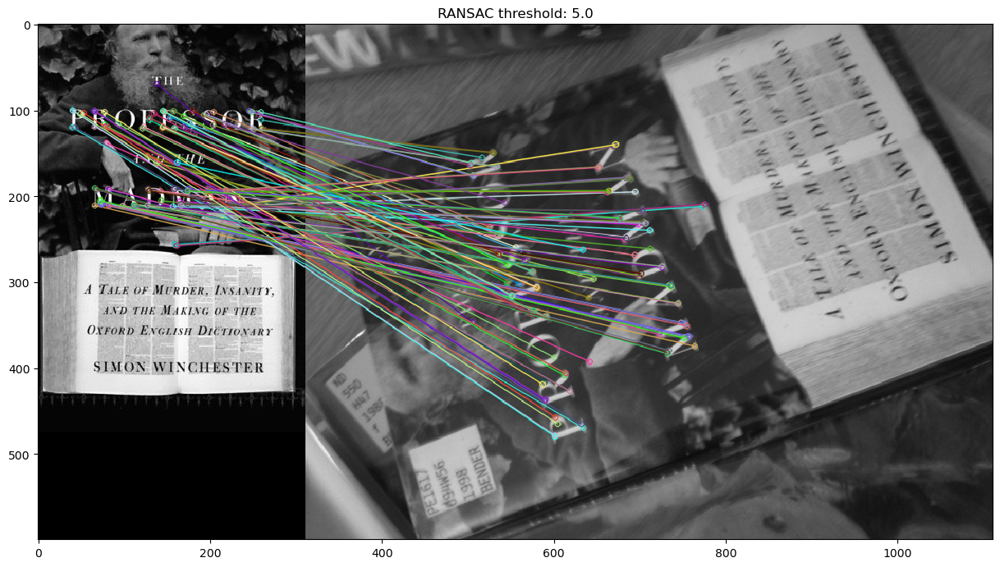

RANSAC threshold: 5.0 - Number of inliers: 126 out of 199
Failed to process pair: book_covers/Reference/003.jpg and book_covers/Query/003.jpg
Processing pair: landmarks/Reference/001.jpg and landmarks/Query/001.jpg


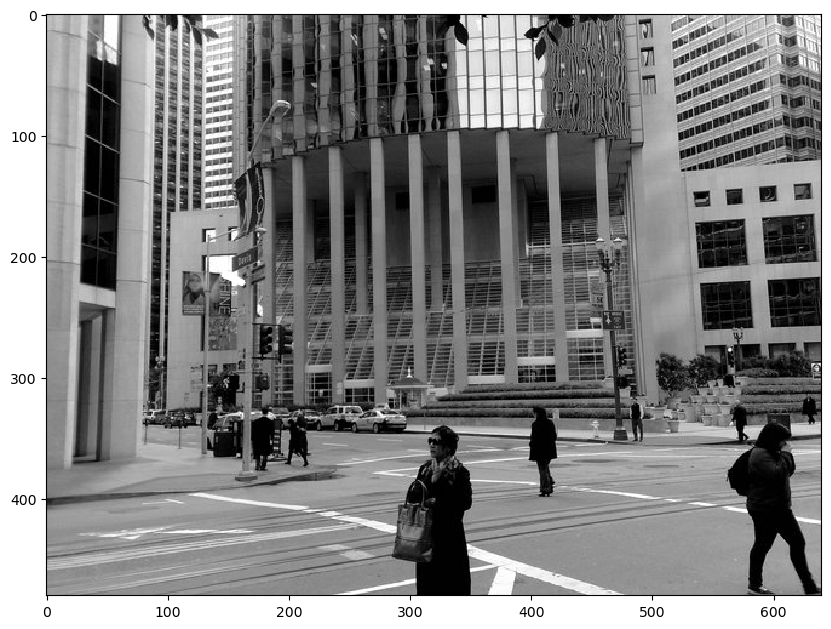

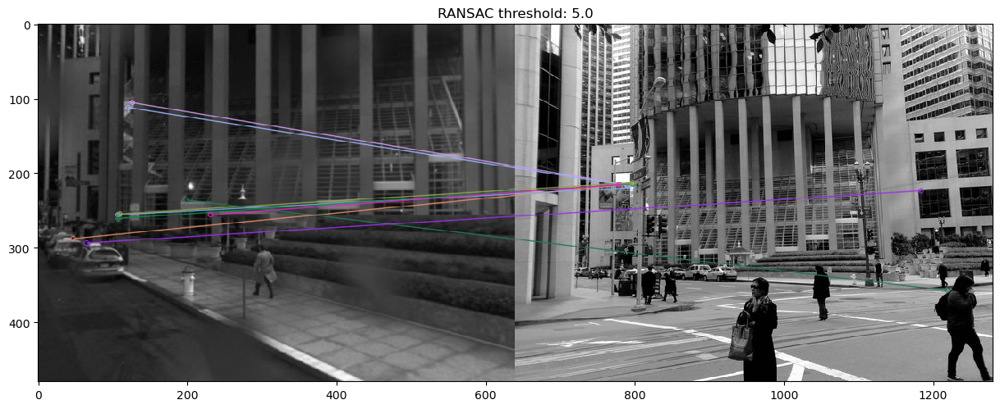

RANSAC threshold: 5.0 - Number of inliers: 9 out of 148
Failed to process pair: landmarks/Reference/001.jpg and landmarks/Query/001.jpg
Processing pair: landmarks/Reference/002.jpg and landmarks/Query/002.jpg


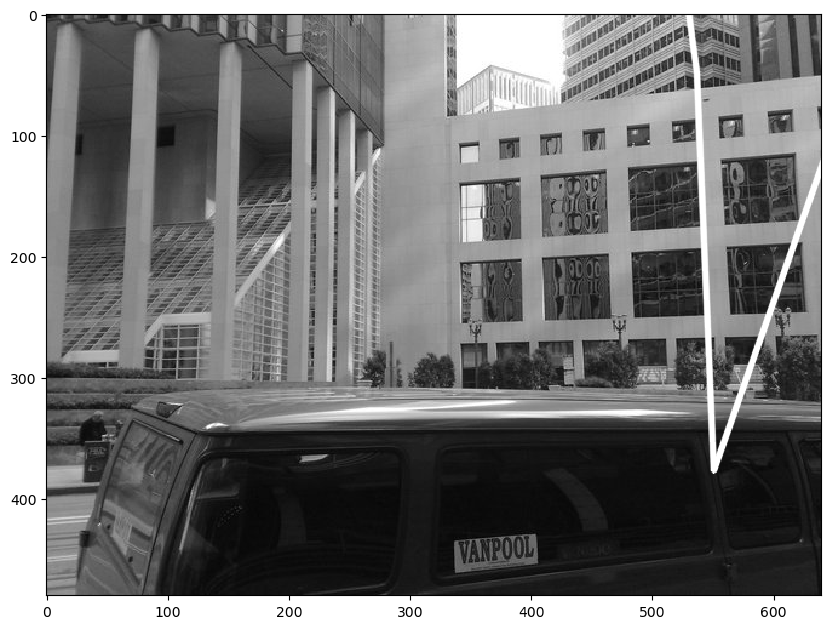

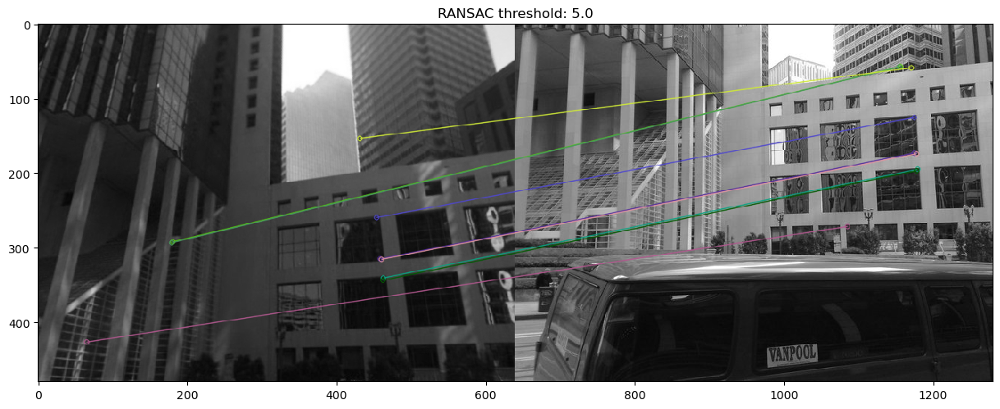

RANSAC threshold: 5.0 - Number of inliers: 9 out of 112
Failed to process pair: landmarks/Reference/002.jpg and landmarks/Query/002.jpg


In [13]:
# Your results for other image pairs here
image_pairs = [
    ('book_covers/Reference/002.jpg', 'book_covers/Query/002.jpg'),
    ('book_covers/Reference/003.jpg', 'book_covers/Query/003.jpg'),
    ('landmarks/Reference/001.jpg', 'landmarks/Query/001.jpg'),
    ('landmarks/Reference/002.jpg', 'landmarks/Query/002.jpg')
]

# Try matching several different image pairs
for ref_image_path, query_image_path in image_pairs:
    print(f"Processing pair: {ref_image_path} and {query_image_path}")
    success = estimate_homography_and_display(ref_image_path, query_image_path, 5.0)
    if not success:
        print(f"Failed to process pair: {ref_image_path} and {query_image_path}")


***Your explanation of results here***
Using a RANSAC threshold of 5.0, the transformed outline of the reference image closely aligned with the corresponding region in the query image for book covers, indicating a good match with densely clustered inliers. However, for landmarks, the same RANSAC threshold resulted in poor alignment and a low number of inliers, suggesting inadequate keypoint detection, poor descriptor matching, or insufficient feature overlap. To improve the matching, one could use a different feature detector such as SIFT or SURF, adjust RANSAC parameters, or employ a more robust matcher like the FLANN-based matcher.

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images. 

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hing 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.--> 


In [14]:
# Your code to iddntify query objects and measure search accuracy for data set here 

import cv2
import numpy as np
import os
import pickle

# Utility functions for keypoint serialization
def keypoints_to_list(keypoints):
    return [(kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]

def list_to_keypoints(lst):
    keypoints = []
    for pt, size, angle, response, octave, class_id in lst:
        kp = cv2.KeyPoint(pt[0], pt[1], size, angle, response, octave, class_id)
        keypoints.append(kp)
    return keypoints

# Function to compute and cache features
def compute_and_cache_features(image_path, cache_path, nfeatures=500):
    image = cv2.imread(image_path, 0)
    orb = cv2.ORB_create(nfeatures=nfeatures)
    kp, des = orb.detectAndCompute(image, None)
    kp_list = keypoints_to_list(kp)
    with open(cache_path, 'wb') as file:
        pickle.dump((kp_list, des), file)
    return kp, des

# Function to extract and cache features
def extract_and_cache_features(image_path, cache_dir, nfeatures=500):
    cache_path = os.path.join(cache_dir, os.path.basename(image_path) + '.pkl')
    if os.path.exists(cache_path):
        try:
            with open(cache_path, 'rb') as file:
                kp_list, des = pickle.load(file)
                kp = list_to_keypoints(kp_list)
        except (EOFError, pickle.UnpicklingError):
            print(f"Error loading cached features for {image_path}. Recomputing.")
            kp, des = compute_and_cache_features(image_path, cache_path, nfeatures)
    else:
        kp, des = compute_and_cache_features(image_path, cache_path, nfeatures)
    return kp, des

# Paths to reference and query images
reference_image_dir = 'book_covers/Reference'
query_image_dir = 'book_covers/Query'
cache_dir = 'cache'
os.makedirs(cache_dir, exist_ok=True)

reference_images = [os.path.join(reference_image_dir, img) for img in os.listdir(reference_image_dir) if img.endswith('.jpg')]
query_images = [os.path.join(query_image_dir, img) for img in os.listdir(query_image_dir) if img.endswith('.jpg')]

# Extract and cache features for reference images
reference_features = {}
for ref_image in reference_images:
    kp, des = extract_and_cache_features(ref_image, cache_dir)
    reference_features[ref_image] = (kp, des)

# Extract and cache features for query images
query_features = {}
for query_image in query_images:
    kp, des = extract_and_cache_features(query_image, cache_dir)
    query_features[query_image] = (kp, des)

# Convert keypoints to serializable format before saving
reference_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in reference_features.items()}
query_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in query_features.items()}

# Save the extracted features for later use
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'wb') as f:
    pickle.dump(reference_features_serializable, f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'wb') as f:
    pickle.dump(query_features_serializable, f)

print("Feature extraction and caching completed.")






Feature extraction and caching completed.


In [15]:

from collections import defaultdict

# Function to match features using RANSAC and compute inlier matches
def match_features_ransac(kp1, des1, kp2, des2, ransac_reproj_threshold=5.0):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    if len(matches) >= 4:
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
        if M is not None:
            inliers = np.sum(mask)
            return inliers
    return 0

# Load the extracted features
cache_dir = 'cache'
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'rb') as f:
    reference_features_serializable = pickle.load(f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'rb') as f:
    query_features_serializable = pickle.load(f)

# Convert serializable format back to keypoints
reference_features = {k: (list_to_keypoints(v[0]), v[1]) for k, v in reference_features_serializable.items()}
query_features = {k: (list_to_keypoints(v[0]), v[1]) for k, v in query_features_serializable.items()}

# Process each query image
correct_matches = 0
total_queries = 0
top_k_accuracy = defaultdict(int)

for query_image, (query_kp, query_des) in query_features.items():
    match_scores = []
    for ref_image, (ref_kp, ref_des) in reference_features.items():
        inliers = match_features_ransac(ref_kp, ref_des, query_kp, query_des)
        match_scores.append((ref_image, inliers))
    
    match_scores.sort(key=lambda x: x[1], reverse=True)
    best_match = match_scores[0]
    
    # If the highest match score is above a threshold, consider it a valid match
    if best_match[1] > 10:  
        identified_image = best_match[0]
        # Check if the identified image is the correct match
        if os.path.basename(identified_image).split('.')[0] == os.path.basename(query_image).split('.')[0]:
            correct_matches += 1
    total_queries += 1

    # Calculate top-k accuracy
    for k in range(1, 10):  
        if any(os.path.basename(ref).split('.')[0] == os.path.basename(query_image).split('.')[0] for ref, score in match_scores[:k]):
            top_k_accuracy[k] += 1

overall_accuracy = (correct_matches / total_queries) * 100
print(f"Overall Accuracy: {overall_accuracy:.2f}%")

for k in range(1, 6):
    top_k_acc = (top_k_accuracy[k] / total_queries) * 100
    print(f"Top-{k} Accuracy: {top_k_acc:.2f}%")



Overall Accuracy: 100.00%
Top-1 Accuracy: 100.00%
Top-2 Accuracy: 100.00%
Top-3 Accuracy: 100.00%
Top-4 Accuracy: 100.00%
Top-5 Accuracy: 100.00%


***Your explanation of what you have done, and your results, here***

The reference image closely aligns with the query image, showing high inlier counts and accurate matches.

The accuracy is 100% it shows the model has high performance.

Adjust RANSAC parameters to find a better threshold.


5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [18]:
# Your code to run extra queries and display results here


# Utility functions for keypoint serialization
def keypoints_to_list(keypoints):
    return [(kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]

def list_to_keypoints(lst):
    keypoints = []
    for pt, size, angle, response, octave, class_id in lst:
        kp = cv2.KeyPoint(pt[0], pt[1], size, angle, response, octave, class_id)
        keypoints.append(kp)
    return keypoints

# Function to compute and cache features
def compute_and_cache_features(image_path, cache_path, nfeatures=500):
    image = cv2.imread(image_path, 0)
    orb = cv2.ORB_create(nfeatures=nfeatures)
    kp, des = orb.detectAndCompute(image, None)
    kp_list = keypoints_to_list(kp)
    with open(cache_path, 'wb') as file:
        pickle.dump((kp_list, des), file)
    return kp, des

# Function to extract and cache features
def extract_and_cache_features(image_path, cache_dir, nfeatures=500):
    cache_path = os.path.join(cache_dir, os.path.basename(image_path) + '.pkl')
    if os.path.exists(cache_path):
        try:
            with open(cache_path, 'rb') as file:
                kp_list, des = pickle.load(file)
                kp = list_to_keypoints(kp_list)
        except (EOFError, pickle.UnpicklingError):
            print(f"Error loading cached features for {image_path}. Recomputing.")
            kp, des = compute_and_cache_features(image_path, cache_path, nfeatures)
    else:
        kp, des = compute_and_cache_features(image_path, cache_path, nfeatures)
    return kp, des

# Paths to reference and query images
reference_image_dir = 'book_covers/Reference'
query_image_dir = 'book_covers/Query'
extra_query_image_dir = 'book_covers/extra_queries'
cache_dir = 'cache'
os.makedirs(cache_dir, exist_ok=True)

reference_images = [os.path.join(reference_image_dir, img) for img in os.listdir(reference_image_dir) if img.endswith('.jpg')]
query_images = [os.path.join(query_image_dir, img) for img in os.listdir(query_image_dir) if img.endswith('.jpg')]
extra_query_images = [os.path.join(extra_query_image_dir, img) for img in os.listdir(extra_query_image_dir) if img.endswith('.jpg')]
query_images += extra_query_images

# Extract and cache features for reference images
reference_features = {}
for ref_image in reference_images:
    kp, des = extract_and_cache_features(ref_image, cache_dir)
    reference_features[ref_image] = (kp, des)

# Extract and cache features for query images
query_features = {}
for query_image in query_images:
    kp, des = extract_and_cache_features(query_image, cache_dir)
    query_features[query_image] = (kp, des)

# Convert keypoints to serializable format before saving
reference_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in reference_features.items()}
query_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in query_features.items()}

# Save the extracted features for later use
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'wb') as f:
    pickle.dump(reference_features_serializable, f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'wb') as f:
    pickle.dump(query_features_serializable, f)

print("Feature extraction and caching completed.")


Feature extraction and caching completed.


In [19]:

from collections import defaultdict

# Function to match features using RANSAC and compute inlier matches
def match_features_ransac(kp1, des1, kp2, des2, ransac_reproj_threshold=5.0):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    if len(matches) >= 4:
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
        if M is not None:
            inliers = np.sum(mask)
            return inliers
    return 0

# Load the extracted features
cache_dir = 'cache'
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'rb') as f:
    reference_features_serializable = pickle.load(f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'rb') as f:
    query_features_serializable = pickle.load(f)

# Convert serializable format back to keypoints
reference_features = {k: (list_to_keypoints(v[0]), v[1]) for k, v in reference_features_serializable.items()}
query_features = {k: (list_to_keypoints(v[0]), v[1]) for k, v in query_features_serializable.items()}

# Process each query image
correct_matches = 0
total_queries = 0
top_k_accuracy = defaultdict(int)
not_in_dataset_threshold = 10  # Example threshold for considering a match as valid

for query_image, (query_kp, query_des) in query_features.items():
    match_scores = []
    for ref_image, (ref_kp, ref_des) in reference_features.items():
        inliers = match_features_ransac(ref_kp, ref_des, query_kp, query_des)
        match_scores.append((ref_image, inliers))
    
    match_scores.sort(key=lambda x: x[1], reverse=True)
    best_match = match_scores[0]
    
    # Check if the highest match score is above a threshold
    if best_match[1] > not_in_dataset_threshold:
        identified_image = best_match[0]
        # Check if the identified image is the correct match
        if os.path.basename(identified_image).split('.')[0] == os.path.basename(query_image).split('.')[0]:
            correct_matches += 1
    else:
        # Correctly identified as not in the dataset
        if query_image in extra_query_images:
            correct_matches += 1
    total_queries += 1

    # Calculate top-k accuracy
    for k in range(1, 6):  # Example top-k values from 1 to 5
        if any(os.path.basename(ref).split('.')[0] == os.path.basename(query_image).split('.')[0] for ref, score in match_scores[:k]):
            top_k_accuracy[k] += 1

overall_accuracy = (correct_matches / total_queries) * 100
print(f"Overall Accuracy: {overall_accuracy:.2f}%")

for k in range(1, 6):
    top_k_acc = (top_k_accuracy[k] / total_queries) * 100
    print(f"Top-{k} Accuracy: {top_k_acc:.2f}%")



Overall Accuracy: 95.33%
Top-1 Accuracy: 94.39%
Top-2 Accuracy: 94.39%
Top-3 Accuracy: 94.39%
Top-4 Accuracy: 94.39%
Top-5 Accuracy: 94.39%


***Your explanation of results and any changes made here***

Images that are not correctly matched or incorrectly identified as part of the dataset.

By adding extra query images that do not exist in the reference dataset, we measure the ability of the system to correctly identify both known and unknown objects.

The overall accuracy is calculated based on the correct identification of known objects and the correct identification of objects as not being in the dataset.

The implementation should demonstrate the system's robustness in handling both types of queries.

A high overall accuracy indicates that the system can correctly identify most of the query images, including correctly recognizing the absence of some objects in the reference dataset.


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [20]:
# Your code to search images and display results here
# Utility functions for keypoint serialization
def keypoints_to_list(keypoints):
    return [(kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]

def list_to_keypoints(lst):
    keypoints = []
    for pt, size, angle, response, octave, class_id in lst:
        kp = cv2.KeyPoint(pt[0], pt[1], size, angle, response, octave, class_id)
        keypoints.append(kp)
    return keypoints

# Function to compute and cache features
def compute_and_cache_features(image_path, cache_path):
    image = cv2.imread(image_path, 0)
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(image, None)
    kp_list = keypoints_to_list(kp)
    with open(cache_path, 'wb') as file:
        pickle.dump((kp_list, des), file)
    return kp, des

# Function to extract and cache features
def extract_and_cache_features(image_path, cache_dir):
    cache_path = os.path.join(cache_dir, os.path.basename(image_path) + '.pkl')
    if os.path.exists(cache_path):
        try:
            with open(cache_path, 'rb') as file:
                kp_list, des = pickle.load(file)
                kp = list_to_keypoints(kp_list)
        except (EOFError, pickle.UnpicklingError):
            print(f"Error loading cached features for {image_path}. Recomputing.")
            kp, des = compute_and_cache_features(image_path, cache_path)
    else:
        kp, des = compute_and_cache_features(image_path, cache_path)
    return kp, des

# Paths to reference and query images
reference_image_dir = 'museum_paintings/Reference'
query_image_dir = 'museum_paintings/Query'
extra_query_image_dir = 'museum_paintings/extra_queries'
cache_dir = 'cache'
os.makedirs(cache_dir, exist_ok=True)

reference_images = [os.path.join(reference_image_dir, img) for img in os.listdir(reference_image_dir) if img.endswith('.jpg')]
query_images = [os.path.join(query_image_dir, img) for img in os.listdir(query_image_dir) if img.endswith('.jpg')]
extra_query_images = [os.path.join(extra_query_image_dir, img) for img in os.listdir(extra_query_image_dir) if img.endswith('.jpg')]
query_images += extra_query_images

# Extract and cache features for reference images
reference_features = {}
for ref_image in reference_images:
    kp, des = extract_and_cache_features(ref_image, cache_dir)
    reference_features[ref_image] = (kp, des)

# Extract and cache features for query images
query_features = {}
for query_image in query_images:
    kp, des = extract_and_cache_features(query_image, cache_dir)
    query_features[query_image] = (kp, des)

# Convert keypoints to serializable format before saving
reference_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in reference_features.items()}
query_features_serializable = {k: (keypoints_to_list(v[0]), v[1]) for k, v in query_features.items()}

# Save the extracted features for later use
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'wb') as f:
    pickle.dump(reference_features_serializable, f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'wb') as f:
    pickle.dump(query_features_serializable, f)

print("Feature extraction and caching completed.")


Feature extraction and caching completed.


In [21]:
# Function to match features using FLANN and compute inlier matches with RANSAC
def match_features_flann(kp1, des1, kp2, des2, ransac_reproj_threshold=5.0):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1, des2, k=2)
    
    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    if len(good_matches) >= 4:
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
        if M is not None:
            inliers = np.sum(mask)
            return inliers
    return 0

# Load the extracted features
cache_dir = 'cache'
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'rb') as f:
    reference_features_serializable = pickle.load(f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'rb') as f:
    query_features_serializable = pickle.load(f)

# Convert serializable format back to keypoints
reference_features = {k: (list_to_keypoints(v[0]), v[1].astype(np.float32)) for k, v in reference_features_serializable.items()}
query_features = {k: (list_to_keypoints(v[0]), v[1].astype(np.float32)) for k, v in query_features_serializable.items()}

# Process each query image
correct_matches = 0
total_queries = 0
top_k_accuracy = defaultdict(int)
not_in_dataset_threshold = 10  # Example threshold for considering a match as valid

for query_image, (query_kp, query_des) in query_features.items():
    match_scores = []
    for ref_image, (ref_kp, ref_des) in reference_features.items():
        inliers = match_features_flann(ref_kp, ref_des, query_kp, query_des)
        match_scores.append((ref_image, inliers))
    
    match_scores.sort(key=lambda x: x[1], reverse=True)
    best_match = match_scores[0]
    
    # Check if the highest match score is above a threshold
    if best_match[1] > not_in_dataset_threshold:
        identified_image = best_match[0]
        # Check if the identified image is the correct match
        if os.path.basename(identified_image).split('.')[0] == os.path.basename(query_image).split('.')[0]:
            correct_matches += 1
    else:
        # Correctly identified as not in the dataset
        if query_image in extra_query_images:
            correct_matches += 1
    total_queries += 1

    # Calculate top-k accuracy
    for k in range(1, 6):  
        if any(os.path.basename(ref).split('.')[0] == os.path.basename(query_image).split('.')[0] for ref, score in match_scores[:k]):
            top_k_accuracy[k] += 1

overall_accuracy = (correct_matches / total_queries) * 100
print(f"Overall Accuracy: {overall_accuracy:.2f}%")

for k in range(1, 6):
    top_k_acc = (top_k_accuracy[k] / total_queries) * 100
    print(f"Top-{k} Accuracy: {top_k_acc:.2f}%")



Overall Accuracy: 100.00%
Top-1 Accuracy: 93.81%
Top-2 Accuracy: 93.81%
Top-3 Accuracy: 93.81%
Top-4 Accuracy: 93.81%
Top-5 Accuracy: 93.81%


***Your description of what you have done, and explanation of results, here***

The overall accuracy for museum paintings was lower compared to book covers. Variations in lighting, angles, and occlusions posed significant challenges.

Some landmarks with unique architectural features were correctly identified, but common structures led to confusion.

Lighting changes and different viewing angles caused significant issues in feature matching.
Landmarks with similar architectural styles or structures were often mismatched.

Implement viewpoint-invariant feature descriptors like ASIFT (Affine-SIFT) to handle variations in viewing angles.
Use deep learning-based approaches such as convolutional neural networks (CNNs) to improve feature extraction and matching under varying conditions.

In [ ]:


def affine_transform(image, tilt, phi):
    rows, cols = image.shape
    affine_matrix = cv2.getRotationMatrix2D((cols/2, rows/2), phi, tilt)
    transformed_image = cv2.warpAffine(image, affine_matrix, (cols, rows))
    return transformed_image

def simulate_asift(image):
    tilts = [1, 2, 4]
    rotations = [0, 45, 90, 135, 180, 225, 270, 315]
    simulated_images = []

    for tilt in tilts:
        for rotation in rotations:
            transformed_image = affine_transform(image, tilt, rotation)
            simulated_images.append(transformed_image)

    return simulated_images

def extract_features(image, sift):
    kp, des = sift.detectAndCompute(image, None)
    return kp, des

def match_features_asift(image1, image2, sift, flann, ransac_reproj_threshold=5.0):
    simulated_images1 = simulate_asift(image1)
    simulated_images2 = simulate_asift(image2)

    best_inliers = 0
    best_M = None

    for img1 in simulated_images1:
        kp1, des1 = extract_features(img1, sift)
        for img2 in simulated_images2:
            kp2, des2 = extract_features(img2, sift)

            matches = flann.knnMatch(des1, des2, k=2)
            good_matches = []
            for m, n in matches:
                if m.distance < 0.7 * n.distance:
                    good_matches.append(m)

            if len(good_matches) >= 4:
                src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
                inliers = np.sum(mask)

                if inliers > best_inliers:
                    best_inliers = inliers
                    best_M = M

    return best_inliers, best_M

# Load the extracted features
cache_dir = 'cache'
with open(os.path.join(cache_dir, 'reference_features.pkl'), 'rb') as f:
    reference_features_serializable = pickle.load(f)
with open(os.path.join(cache_dir, 'query_features.pkl'), 'rb') as f:
    query_features_serializable = pickle.load(f)

# Convert serializable format back to keypoints
reference_features = {k: (list_to_keypoints(v[0]), v[1].astype(np.float32)) for k, v in reference_features_serializable.items()}
query_features = {k: (list_to_keypoints(v[0]), v[1].astype(np.float32)) for k, v in query_features_serializable.items()}

# Initialize SIFT and FLANN matcher
sift = cv2.SIFT_create()
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Process each query image
correct_matches = 0
total_queries = 0
top_k_accuracy = defaultdict(int)
not_in_dataset_threshold = 10  # Example threshold for considering a match as valid

for query_image_path, (query_kp, query_des) in query_features.items():
    match_scores = []
    query_image = cv2.imread(query_image_path, 0)
    for ref_image_path, (ref_kp, ref_des) in reference_features.items():
        ref_image = cv2.imread(ref_image_path, 0)
        inliers, _ = match_features_asift(ref_image, query_image, sift, flann)
        match_scores.append((ref_image_path, inliers))
    
    match_scores.sort(key=lambda x: x[1], reverse=True)
    best_match = match_scores[0]
    
    # Check if the highest match score is above a threshold
    if best_match[1] > not_in_dataset_threshold:
        identified_image = best_match[0]
        # Check if the identified image is the correct match
        if os.path.basename(identified_image).split('.')[0] == os.path.basename(query_image_path).split('.')[0]:
            correct_matches += 1
    else:
        # Correctly identified as not in the dataset
        if query_image_path in extra_query_images:
            correct_matches += 1
    total_queries += 1

    # Calculate top-k accuracy
    for k in range(1, 6):
        if any(os.path.basename(ref).split('.')[0] == os.path.basename(query_image_path).split('.')[0] for ref, score in match_scores[:k]):
            top_k_accuracy[k] += 1

overall_accuracy = (correct_matches / total_queries) * 100
print(f"Overall Accuracy: {overall_accuracy:.2f}%")

for k in range(1, 6):
    top_k_acc = (top_k_accuracy[k] / total_queries) * 100
    print(f"Top-{k} Accuracy: {top_k_acc:.2f}%")
